In [7]:
# Importando os módulos:
import pandas as pd
import folium
from folium import plugins, Map
import matplotlib.pyplot as plt
import numpy as np
from API_google import reverse_geocode
import seaborn as sns
import csv 
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [8]:
# Nova data frame com os dados tratados (rodar todas as vezes)
df= pd.read_csv(r"dataset_consumo_2.csv", delimiter=';', encoding='ANSI')

In [9]:
df['LATITUDE'] = df['LATITUDE'].str.replace(',','.')
df['LONGITUDE'] = df['LONGITUDE'].str.replace(',','.')

In [10]:
df

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE,FAIXA ETARIA,CONSUMO
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,30/01/1981 00:00,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,Jaguaruana,Ceará,street_address,1981.0,40.0,30 a 40 anos,SERVICO
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,28/01/1978 00:00,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CPF,Balneário Camboriú,Santa Catarina,street_address,1978.0,43.0,40 a 50 anos,FARMACIAS
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,09/12/1954 00:00,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CPF,Teresina,Piauí,street_address,1954.0,67.0,60 a 70 anos,SERVICO
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,28/08/1975 00:00,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,1975.0,46.0,40 a 50 anos,M.O.T.O.
4,0cef9719-0aa3-49a2-adea-9c09c04de071,17/06/1957 00:00,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,Capelinha,Minas Gerais,street_address,1957.0,64.0,60 a 70 anos,M.O.T.O.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,f2261fce-83c5-4f64-b145-85f46bcf18b1,08/10/1979 00:00,"DE R$ 1.900,00 A R$ 3.800,00","2.776,00",-11.60937194,-47.04750645,CPF,Porto Alegre do Tocantins,Tocantins,route,1979.0,42.0,40 a 50 anos,VAREJO
9996,bdaa7802-4650-44a4-93f7-952b72ec17a0,30/04/1980 00:00,"DE R$ 3.800,00 A R$ 7.600,00","4.099,00",-15.65049668,-47.79332059,CPF,Brasília,Distrito Federal,street_address,1980.0,41.0,40 a 50 anos,SERVICO
9997,e7b37cd5-714a-44d8-ad7f-4ed3aa6b0695,26/05/1976 00:00,"DE R$ 788,00 A R$ 1.140,00","1.052,00",-8.330678649,-36.13689703,CPF,São Caetano,Pernambuco,street_address,1976.0,45.0,40 a 50 anos,SERVICO
9998,167dbd7f-7ccd-4aad-a6b9-c3fb9d56c9cd,06/11/1985 00:00,"DE R$ 788,00 A R$ 1.140,00",958,NaN,NaN,CNPJ,NaN,NaN,NaN,1985.0,36.0,30 a 40 anos,ARTIGOS ELETRO


In [11]:
df_groupo_consumo = df.groupby(['RENDA','IDADE','CONSUMO','LATITUDE','LONGITUDE'])['ID_USUARIO'].count()

In [12]:
df_groupo_consumo

RENDA                         IDADE  CONSUMO         LATITUDE      LONGITUDE   
DE R$ 1.900,00 A R$ 3.800,00  29.0   M.O.T.O.        -8.764471667  -63.89557667    1
                                     SERVICO         -1.332873777  -48.39259052    1
                                                     -2.530805019  -44.28422063    1
                              30.0   LOJA DE DEPART  -3.026175833  -59.93573       1
                                     RESTAURANTE     -8.78585      -63.89499       1
                                                                                  ..
MAIOR QUE R$ 7.600,00         83.0   VAREJO          -23.57919     -46.58323       1
                              90.0   ARTIGOS ELETRO  -22.7771928   -43.35334421    1
                              91.0   SERVICO         -23.02210546  -43.48052763    1
                              99.0   VAREJO          -22.57514     -44.96071       1
                              103.0  HOSP E CLINICA  -22.98644     -43

In [13]:
df=df.dropna(subset=['LONGITUDE'])
df=df.dropna(subset=['LATITUDE'])
m = folium.Map(
    location=[-5.7793, -35.2009],
    tiles='cartodbdark_matter',
    zoom_start=11
)
mc = MarkerCluster()

for index, creche in df.iterrows():
  mc.add_child(folium.Marker([creche['LATITUDE'], creche['LONGITUDE']], 
              popup=str(creche[['CONSUMO','RENDA','IDADE']]),
              icon=folium.Icon(color="red", icon="info-sign"))).add_to(m)
m

In [14]:
state_encoder = LabelEncoder()
state_encoder.fit(df['RENDA'].unique())
df['RENDA'] = state_encoder.transform(df['RENDA'])
df['RENDA'].unique()

array([0, 1, 2, 3])

In [15]:
state_encoder = LabelEncoder()
state_encoder.fit(df['CONSUMO'].unique())
df['CONSUMO'] = state_encoder.transform(df['CONSUMO'])
df['CONSUMO'].unique()

array([17,  5, 11,  2, 20, 10, 21,  6, 16, 18, 15, 12, 14,  4, 13,  9, 19,
        0,  3,  7,  8,  1])

In [16]:
state_encoder = LabelEncoder()
state_encoder.fit(df['IDADE'].unique())
df['IDADE'] = state_encoder.transform(df['IDADE'])
df['IDADE'].unique()

array([19, 22, 46, 25, 43, 21, 27, 42, 24, 68, 32, 13, 30, 36, 91, 28, 51,
       20, 14, 53, 17, 52, 35, 11, 34, 47, 49, 26, 33, 38, 75, 62, 45, 44,
       48, 23, 61, 18, 40, 29, 63, 72, 64, 12, 16, 39, 41, 71, 15, 60, 37,
       66, 73, 54, 74,  6, 81, 50, 83, 76, 65, 69, 55, 59, 31,  9,  3, 58,
       79, 57, 70, 56,  2, 77, 82, 67, 80, 85, 10,  4, 78, 84,  7,  1,  0,
        5,  8, 86, 87, 90, 88, 89], dtype=int64)

In [17]:
state_encoder = LabelEncoder()
state_encoder.fit(df['LATITUDE'].unique())
df['LATITUDE'] = state_encoder.transform(df['LATITUDE'])
df['LATITUDE'].unique()

array([7419, 5675, 7445, ..., 1079, 8166, 1121])

In [18]:
state_encoder = LabelEncoder()
state_encoder.fit(df['LONGITUDE'].unique())
df['LONGITUDE'] = state_encoder.transform(df['LONGITUDE'])
df['LONGITUDE'].unique()

array([ 630, 4813, 1940, ..., 4272,  442, 4501])

In [19]:
df_teste=df[['CONSUMO','RENDA','IDADE','LATITUDE','LONGITUDE']]
df_teste.dtypes

CONSUMO      int32
RENDA        int32
IDADE        int64
LATITUDE     int32
LONGITUDE    int32
dtype: object

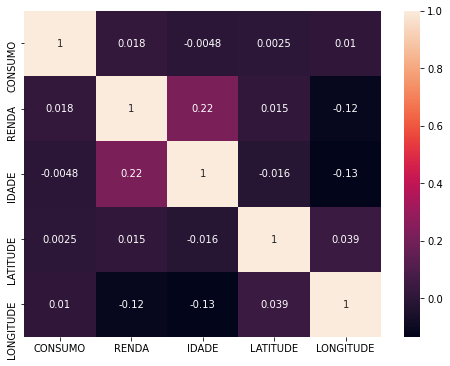

In [20]:
corr_df = df_teste.corr(method='pearson')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

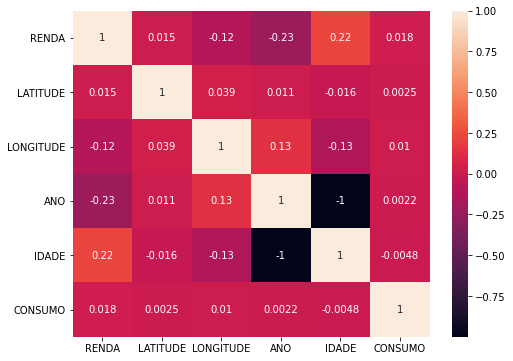

In [21]:
corr_df = df.corr(method='pearson')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

In [22]:
df_cluster=df[['CONSUMO','RENDA','IDADE','LATITUDE','LONGITUDE']]

In [23]:
#Normalização com média 0 e desvio 1
normaliza = MinMaxScaler()

In [24]:
#Aplica a normalização
X_std = normaliza.fit_transform(df_cluster)

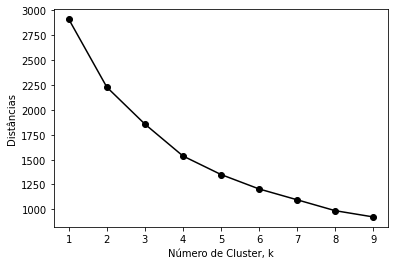

In [25]:
#aplicando a curva do cotovelo para encontrar o número de clusters
ks = range(1,10)
inertias = []
for k in ks:
    #cria o objeto para modelo k-means para os testes
    model = KMeans(n_clusters=k)
    
    #aplica nos componentes selecionados
    model.fit(X_std)
    
    #adiciona os valores para a distância (agitação)
    inertias.append(model.inertia_)
    

plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('Número de Cluster, k')
plt.ylabel('Distâncias')
plt.xticks(ks)
plt.show()

In [50]:
# Cálculo do WCSSE - Within Cluster Sum of Squared Errors
wcsse = []
maxclusters = 11
for i in range(1, maxclusters):
    kmeans = KMeans(n_clusters = i, init = 'random')
    kmeans.fit(df_cluster)
    print (i,kmeans.inertia_)
    wcsse.append(kmeans.inertia_)

1 106703460797.15013
2 64286276235.40372
3 35711045157.51264
4 21476314177.29714
5 15576178477.09753
6 12823331476.353374
7 10294443832.407963
8 9128247596.77555
9 7907587993.337783
10 7072797804.453204


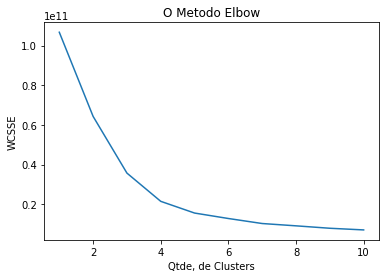

In [51]:
# Plotagem do Gráfico para visualização do "cotovelo" - Método de Elbow
# Ao final do Estudo do Metodo de Elbow a seguir, foram gerados 11 clusters
plt.plot(range(1, maxclusters), wcsse)
plt.title('O Metodo Elbow')
plt.xlabel('Qtde, de Clusters')
plt.ylabel('WCSSE') # Within Cluster Sum of Squares
plt.show()

In [26]:
#transformando os dados normalizados em um dataframe
df_grupc_norma = pd.DataFrame(X_std, columns=['CONSUMO','RENDA','IDADE','LATITUDE','LONGITUDE'])

In [27]:
#Agora todos os valores estão entre 0 e 1
df_grupc_norma.head(2)

,CONSUMO,RENDA,IDADE,LATITUDE,LONGITUDE
0,0.809524,0.000000,0.208791,0.872516,0.074074
1,0.238095,0.333333,0.241758,0.667412,0.565902


In [28]:
#Realizando a aplicação do Kmeans
km = KMeans(n_clusters=4)
clusters = km.fit_predict(df_grupc_norma)
df_grupc_norma['cluster'] = clusters
df_grupc_norma.head()

,CONSUMO,RENDA,IDADE,LATITUDE,LONGITUDE,cluster
0,0.809524,0.000000,0.208791,0.872516,0.074074,2
1,0.238095,0.333333,0.241758,0.667412,0.565902,1
2,0.809524,0.333333,0.505495,0.875573,0.228101,2
3,0.523810,0.666667,0.274725,0.115018,0.531217,0
4,0.523810,0.666667,0.472527,0.187346,0.215403,0


In [29]:
cluster_0 = df_grupc_norma[df_grupc_norma['cluster'] == 0]
cluster_1 = df_grupc_norma[df_grupc_norma['cluster'] == 1]
cluster_2 = df_grupc_norma[df_grupc_norma['cluster'] == 2]
cluster_3 = df_grupc_norma[df_grupc_norma['cluster'] == 3]

In [56]:
cluster_1

,CONSUMO,RENDA,IDADE,LATITUDE,LONGITUDE,cluster
1,0.238095,0.333333,0.241758,0.667412,0.565902,1
7,0.523810,0.000000,0.208791,0.917911,0.533098,1
11,0.523810,0.333333,0.747253,0.696695,0.851852,1
13,0.095238,0.000000,0.142857,0.873927,0.543798,1
15,0.809524,0.000000,0.395604,0.845466,0.872663,1
...,...,...,...,...,...,...
8718,0.809524,0.333333,0.296703,0.791721,0.825044,1
8726,0.523810,0.000000,0.384615,0.662942,0.585068,1
8731,0.095238,0.000000,0.252747,0.747266,0.879835,1
8736,0.809524,0.000000,0.241758,0.742797,0.742152,1


In [58]:
cluster_2 

,CONSUMO,RENDA,IDADE,LATITUDE,LONGITUDE,cluster
0,0.809524,0.000000,0.208791,0.872516,0.074074,2
2,0.809524,0.333333,0.505495,0.875573,0.228101,2
5,0.095238,0.666667,0.230769,0.875221,0.362140,2
6,0.809524,0.666667,0.296703,0.798424,0.387419,2
10,0.095238,0.000000,0.263736,0.944255,0.008230,2
...,...,...,...,...,...,...
8725,0.952381,0.666667,0.208791,0.793720,0.136508,2
8727,0.095238,0.000000,0.263736,0.960249,0.051852,2
8734,0.476190,0.666667,0.307692,0.941197,0.001881,2
8737,0.095238,0.000000,0.285714,0.809009,0.102058,2


In [59]:
cluster_3

,CONSUMO,RENDA,IDADE,LATITUDE,LONGITUDE,cluster
3,0.523810,0.666667,0.274725,0.115018,0.531217,3
4,0.523810,0.666667,0.472527,0.187346,0.215403,3
8,0.095238,0.666667,0.461538,0.200517,0.315226,3
12,0.809524,0.666667,0.351648,0.207574,0.360847,3
20,0.809524,0.666667,0.560440,0.252852,0.341681,3
...,...,...,...,...,...,...
8710,0.952381,0.666667,0.472527,0.519817,0.437978,3
8720,0.285714,1.000000,0.901099,0.508879,0.255379,3
8721,0.095238,0.666667,0.285714,0.530871,0.712992,3
8728,0.809524,0.666667,0.791209,0.656121,0.873721,3


In [30]:
km.cluster_centers_

array([[0.74826098, 0.6669798 , 0.43954495, 0.3671621 , 0.54985151],
       [0.7373829 , 0.10985192, 0.27853606, 0.71989359, 0.78147828],
       [0.74291583, 0.39612676, 0.335871  , 0.91155317, 0.10358499],
       [0.73610141, 0.11511817, 0.3653779 , 0.29534859, 0.41248561]])

In [27]:
cluster_1['customer_city_codes_reversed'] = cluster_1['CONSUMO'].map(df['CONSUMO'])

<ipython-input-27-35b183e71111>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_1['customer_city_codes_reversed'] = cluster_1['CONSUMO'].map(df['CONSUMO'])


In [28]:
ind_list = list(cluster_1.index)
cluster1_original = df.iloc[ind_list]

In [29]:
cluster1_original

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE,FAIXA ETARIA,CONSUMO
9,a3d1ee2f-7ea5-42ff-b6d1-87d5eda81800,13/09/1976 00:00,0,"2.907,00",764,804,CPF,Salvador,Bahia,street_address,1976.0,24,40 a 50 anos,2
14,79639876-7cc9-476d-8c7b-163a729cbaf6,13/08/1970 00:00,1,"4.674,00",4898,3608,CPF,São Bernardo do Campo,São Paulo,street_address,1970.0,30,50 a 60 anos,20
17,116f1241-1e1c-4376-8f93-98e930c89284,20/05/1975 00:00,0,"3.607,00",1310,5192,CPF,Nerópolis,Goiás,street_address,1975.0,25,40 a 50 anos,11
18,247dc6d8-df54-4a59-9e72-560dfa260f24,NaN,1,"4.814,00",4063,2242,CPF,Rio de Janeiro,Rio de Janeiro,street_address,NaN,91,NaN,17
19,50f6be5c-34f8-48ce-b59b-45cc10229257,16/01/1972 00:00,0,"2.418,00",1707,2956,CPF,Santo Hipólito,Minas Gerais,premise,1972.0,28,40 a 50 anos,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9988,a052d4b9-aacf-48f7-afe5-6948ad692d73,02/06/1967 00:00,1,"4.415,00",2297,3037,CPF,São Luís,Maranhão,street_address,1967.0,33,50 a 60 anos,2
9989,239cd94e-cfd3-41a8-9838-5d11180881c6,30/06/1977 00:00,0,"3.029,00",4871,3794,CPF,Embu das Artes,São Paulo,street_address,1977.0,23,40 a 50 anos,20
9995,f2261fce-83c5-4f64-b145-85f46bcf18b1,08/10/1979 00:00,0,"2.776,00",423,3910,CPF,Porto Alegre do Tocantins,Tocantins,route,1979.0,21,40 a 50 anos,20
9996,bdaa7802-4650-44a4-93f7-952b72ec17a0,30/04/1980 00:00,1,"4.099,00",1079,4272,CPF,Brasília,Distrito Federal,street_address,1980.0,20,40 a 50 anos,17
